---
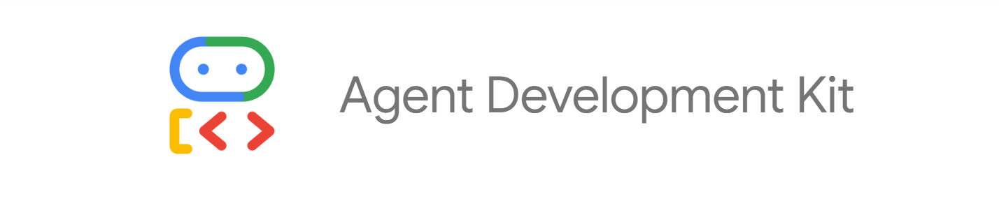

---

## `before_after_agent`
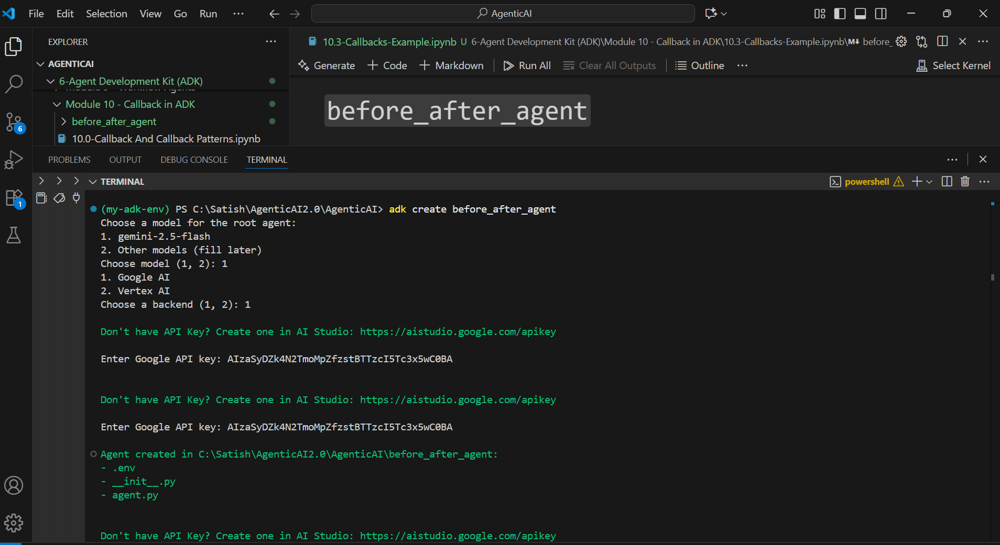
```Python
"""
Before and After Agent Callbacks Example

This example demonstrates how to use both before_agent_callback and after_agent_callback 
for logging purposes.
"""

from datetime import datetime
from typing import Optional

from google.adk.agents import LlmAgent
from google.adk.agents.callback_context import CallbackContext
from google.genai import types


def before_agent_callback(callback_context: CallbackContext) -> Optional[types.Content]:
    """
    Simple callback that logs when the agent starts processing a request.

    Args:
        callback_context: Contains state and context information

    Returns:
        None to continue with normal agent processing
    """
    # Get the session state
    state = callback_context.state

    # Record timestamp
    timestamp = datetime.now()

    # Set agent name if not present
    if "agent_name" not in state:
        state["agent_name"] = "SimpleChatBot"

    # Initialize request counter
    if "request_counter" not in state:
        state["request_counter"] = 1
    else:
        state["request_counter"] += 1

    # Store start time for duration calculation in after_agent_callback
    state["request_start_time"] = timestamp

    # Log the request
    print("=== AGENT EXECUTION STARTED ===")
    print(f"Request #: {state['request_counter']}")
    print(f"Timestamp: {timestamp.strftime('%Y-%m-%d %H:%M:%S')}")

    # Print to console
    print(f"\n[BEFORE CALLBACK] Agent processing request #{state['request_counter']}")

    return None


def after_agent_callback(callback_context: CallbackContext) -> Optional[types.Content]:
    """
    Simple callback that logs when the agent finishes processing a request.

    Args:
        callback_context: Contains state and context information

    Returns:
        None to continue with normal agent processing
    """
    # Get the session state
    state = callback_context.state

    # Calculate request duration if start time is available
    timestamp = datetime.now()
    duration = None
    if "request_start_time" in state:
        duration = (timestamp - state["request_start_time"]).total_seconds()

    # Log the completion
    print("=== AGENT EXECUTION COMPLETED ===")
    print(f"Request #: {state.get('request_counter', 'Unknown')}")
    if duration is not None:
        print(f"Duration: {duration:.2f} seconds")

    # Print to console
    print(
        f"[AFTER CALLBACK] Agent completed request #{state.get('request_counter', 'Unknown')}"
    )
    if duration is not None:
        print(f"[AFTER CALLBACK] Processing took {duration:.2f} seconds")

    return None


# Create the Agent
root_agent = LlmAgent(
    name="before_after_agent",
    model="gemini-2.0-flash",
    description="A basic agent that demonstrates before and after agent callbacks",
    instruction="""
    You are a friendly greeting agent. Your name is {agent_name}.
    
    Your job is to:
    - Greet users politely
    - Respond to basic questions
    - Keep your responses friendly and concise
    """,
    before_agent_callback=before_agent_callback,
    after_agent_callback=after_agent_callback,
)
```
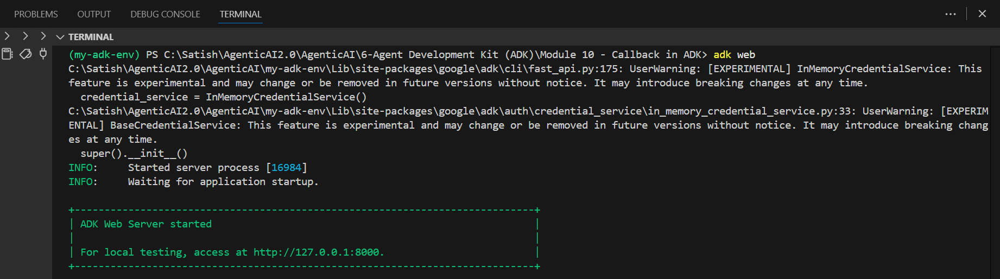 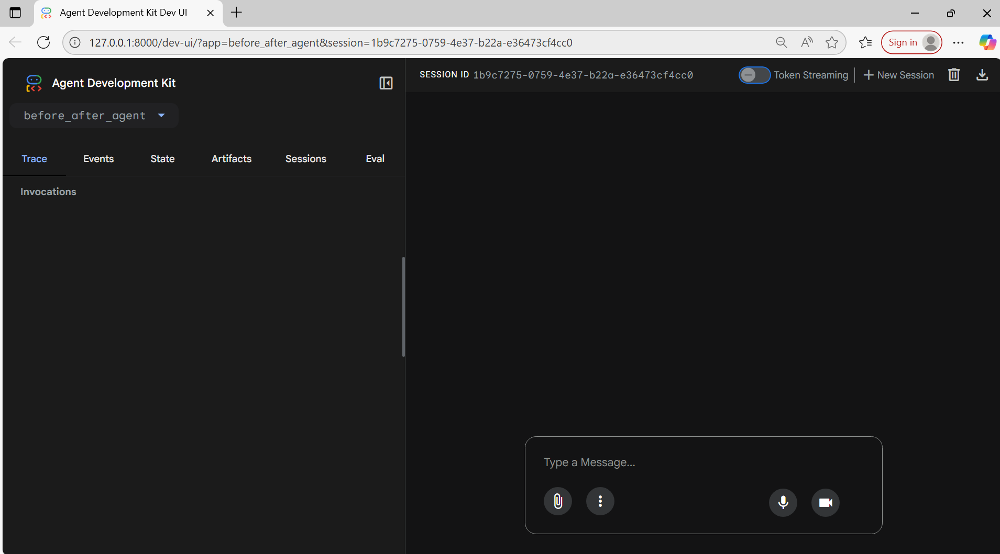 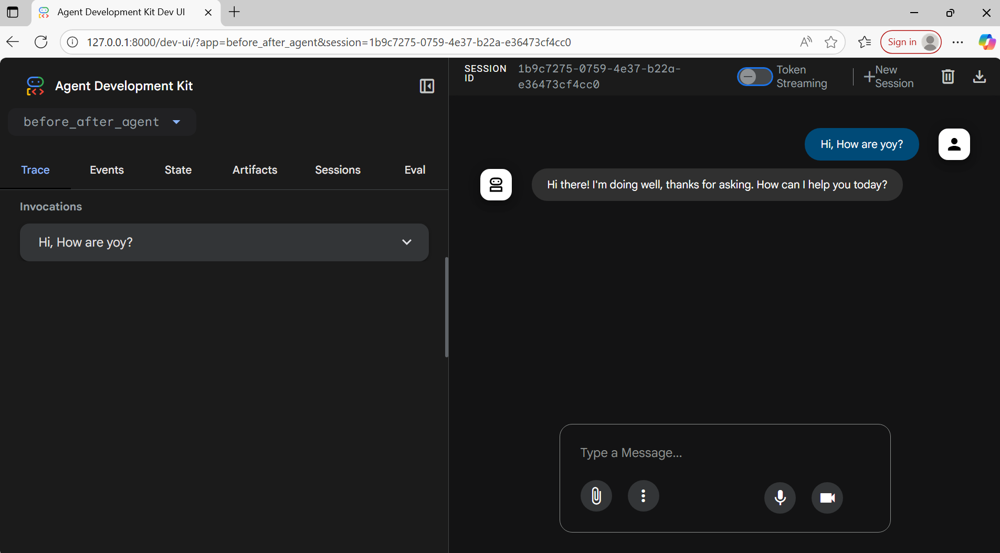 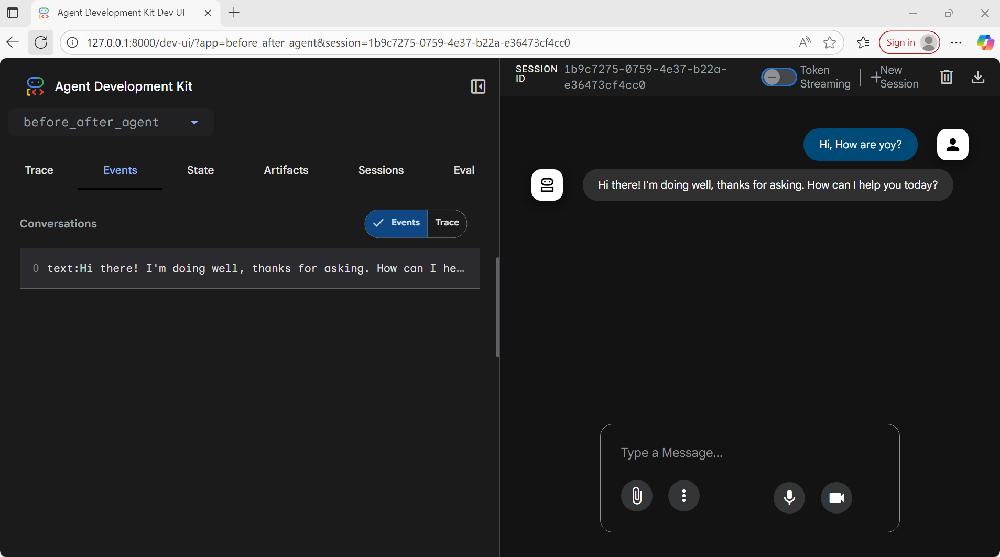 

### `State -> request_counter: 1`
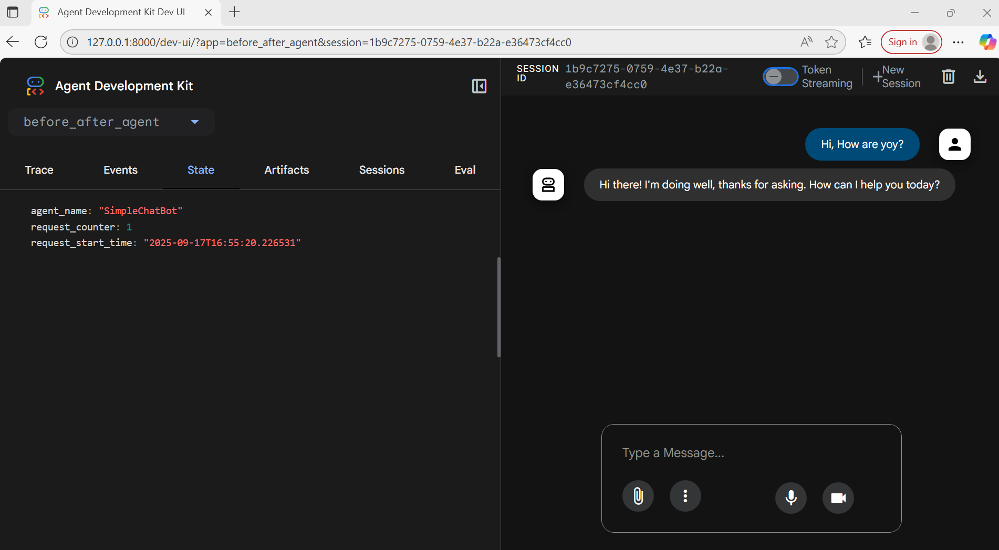 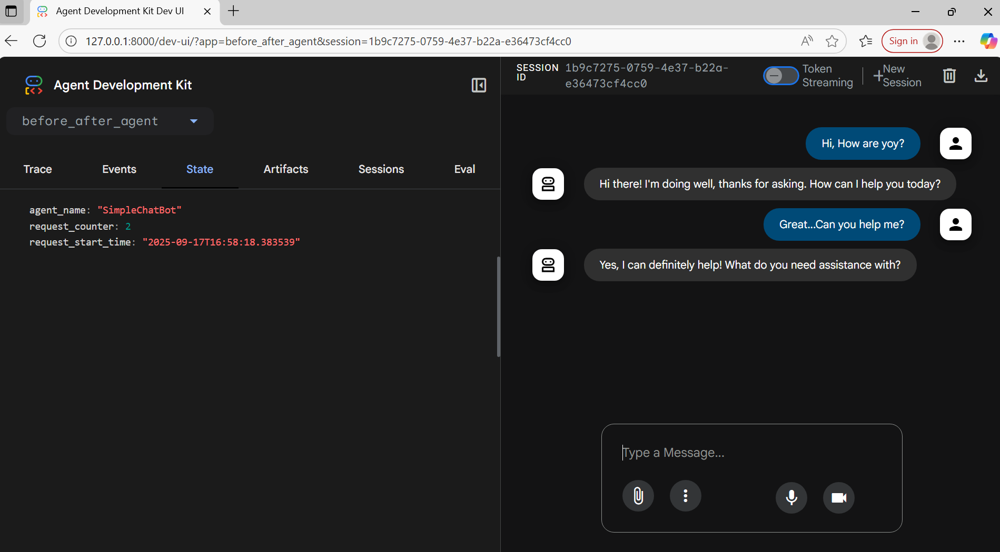 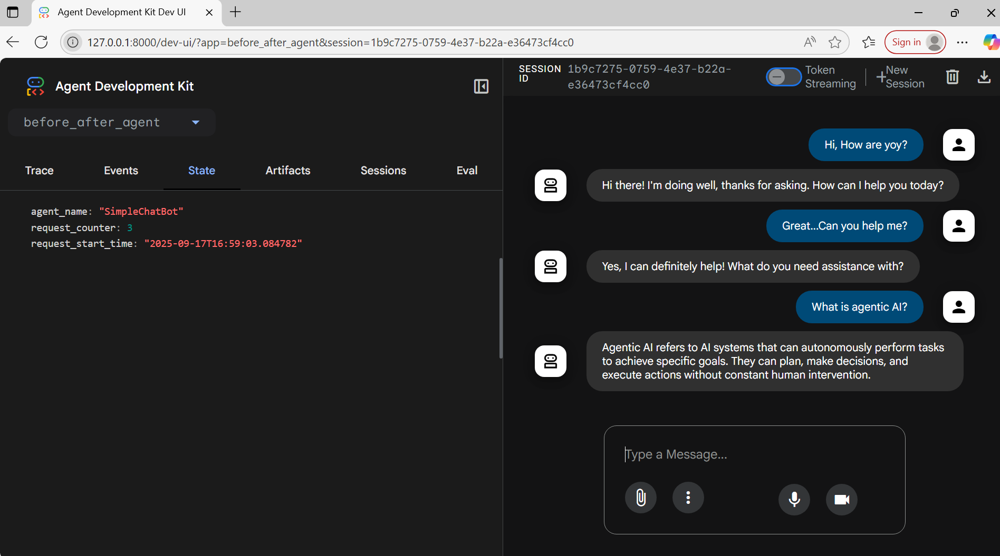

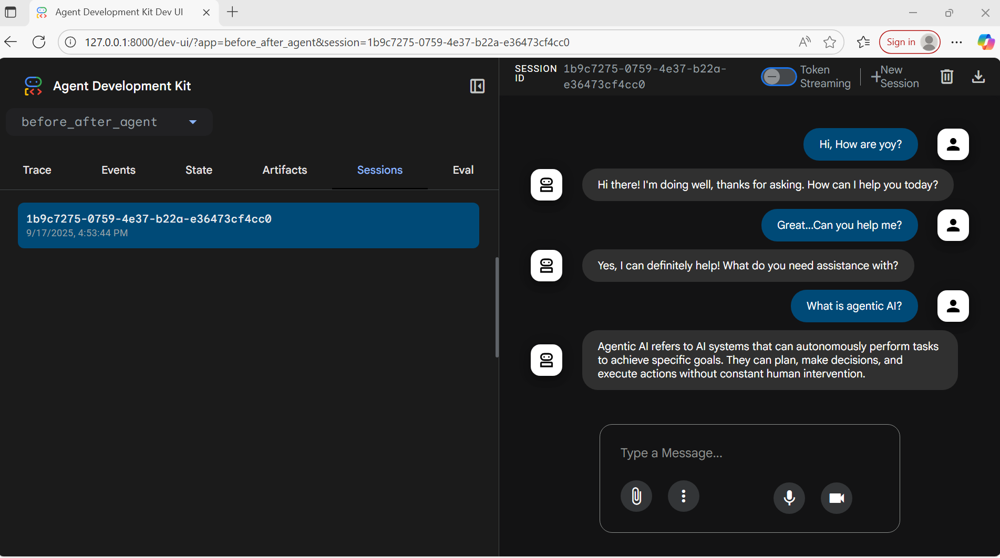 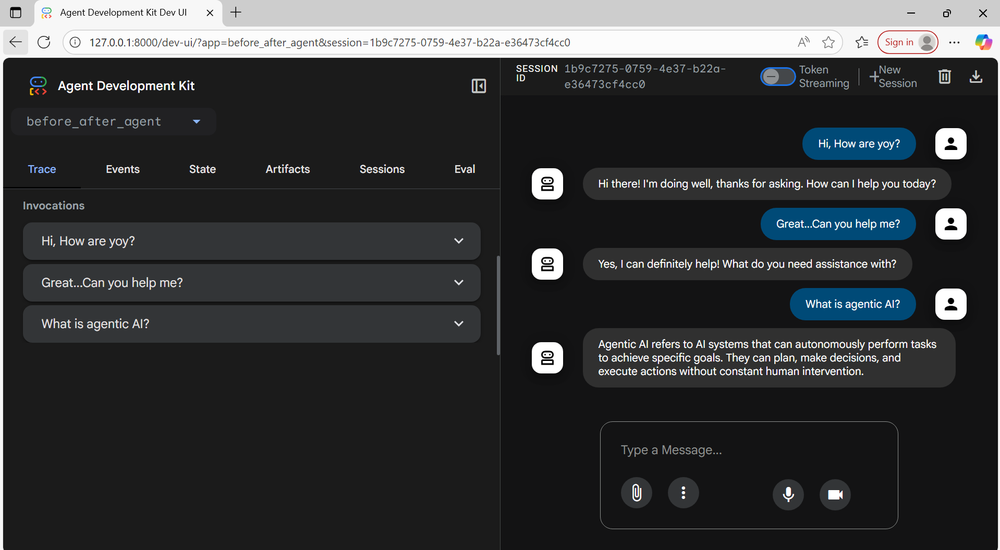 
...
 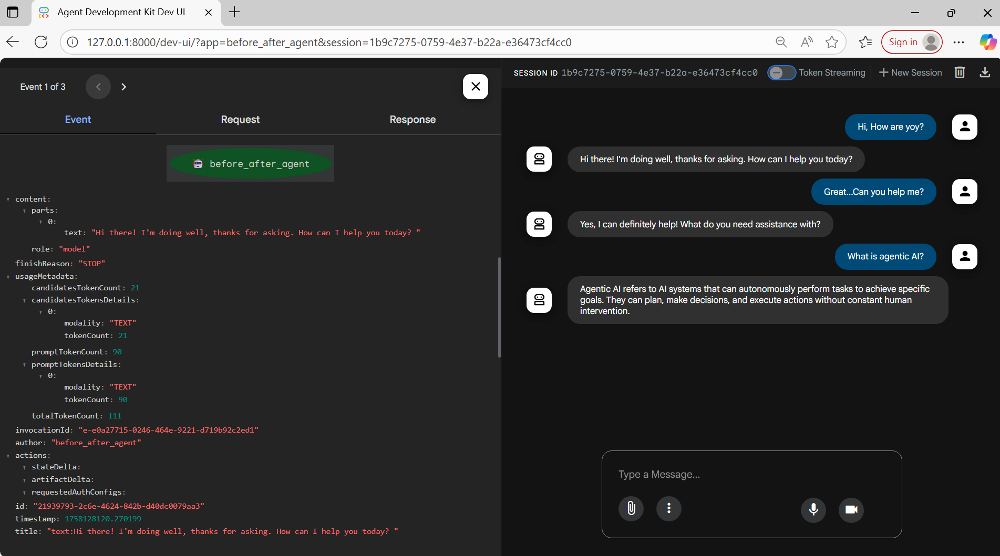 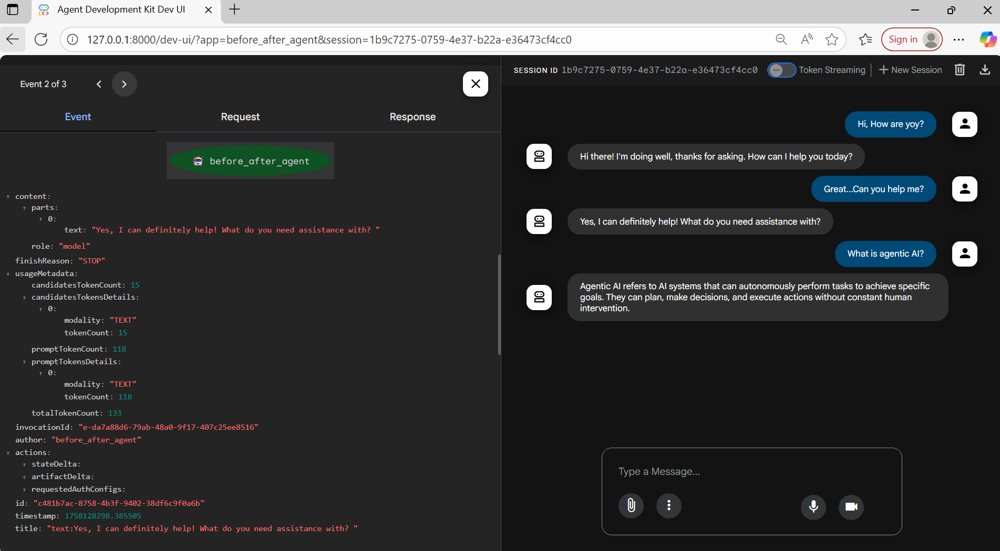 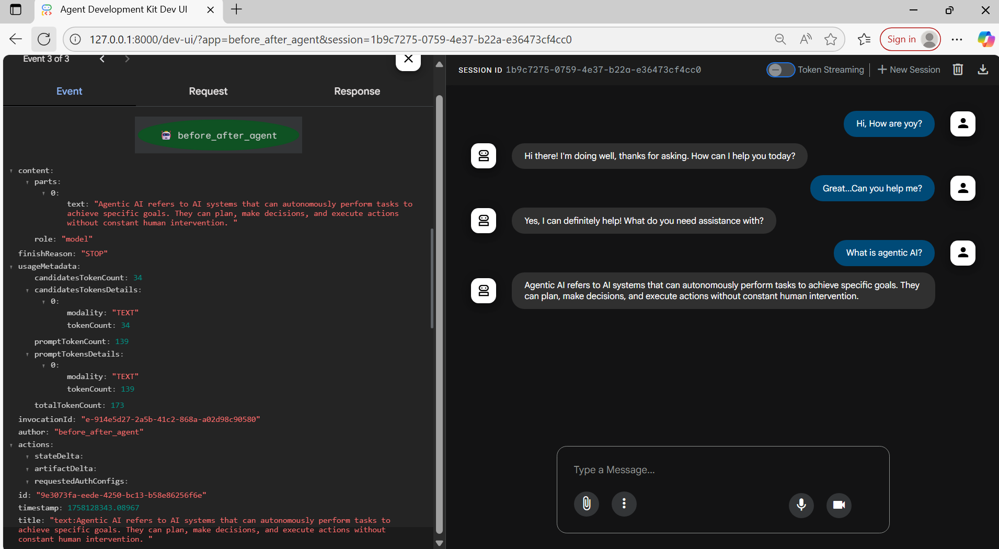 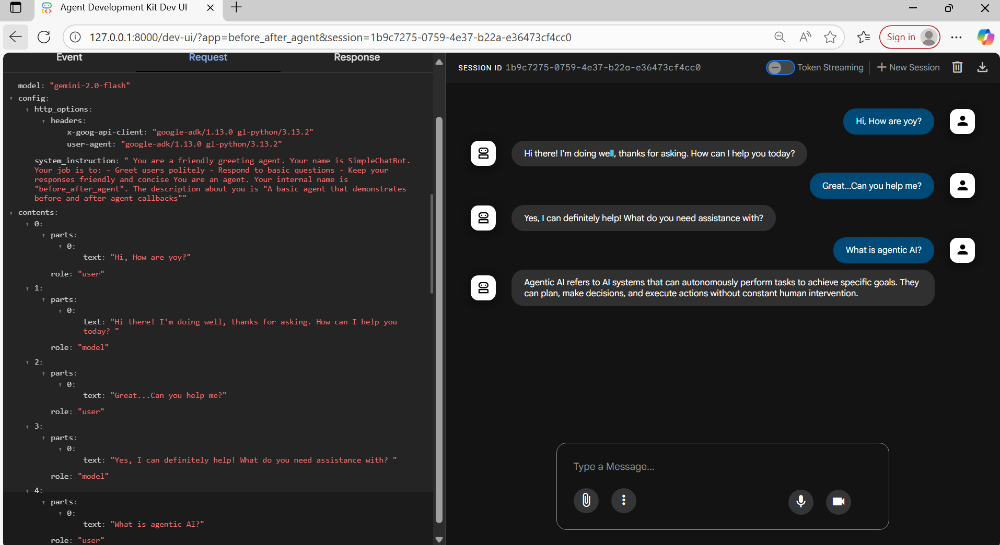 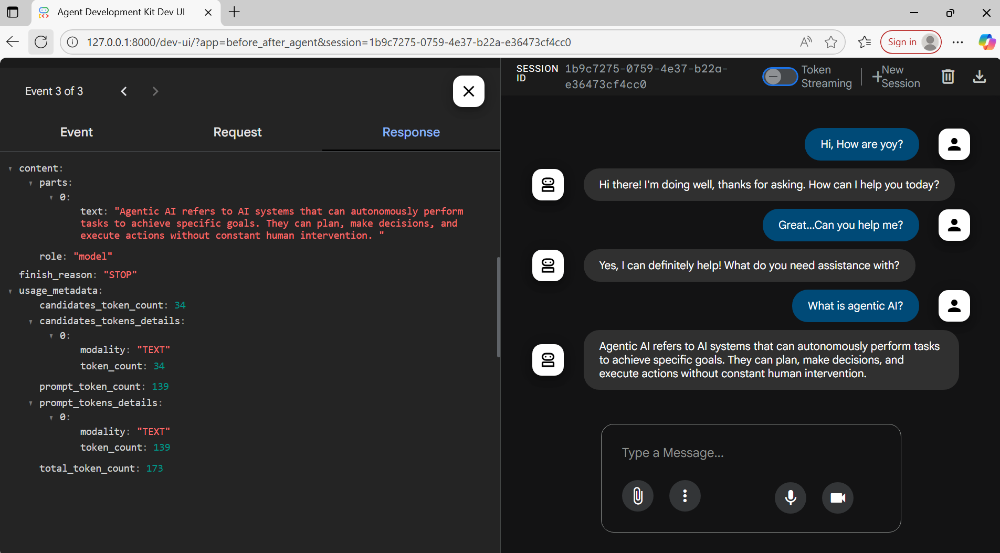 

### `Logs`
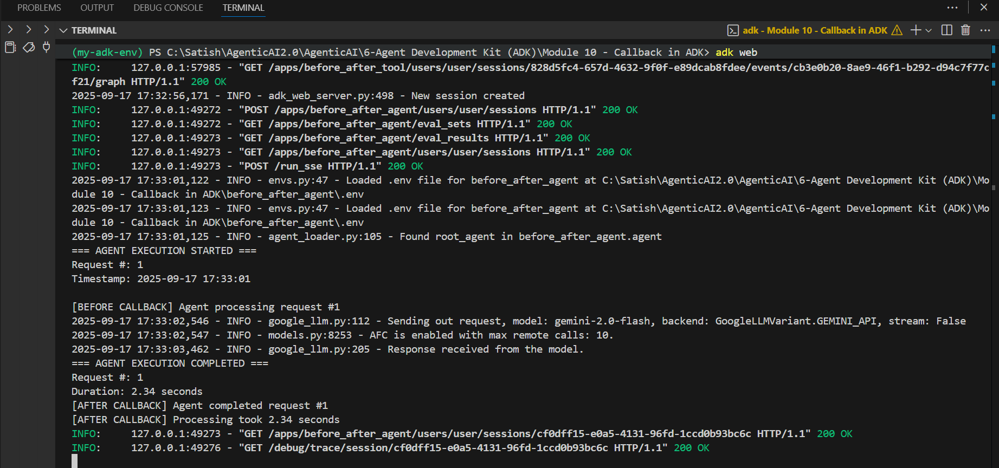  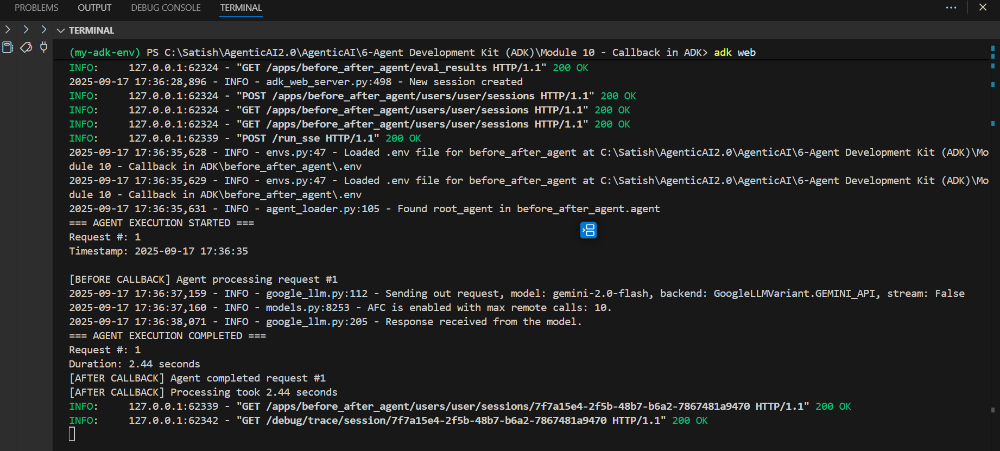

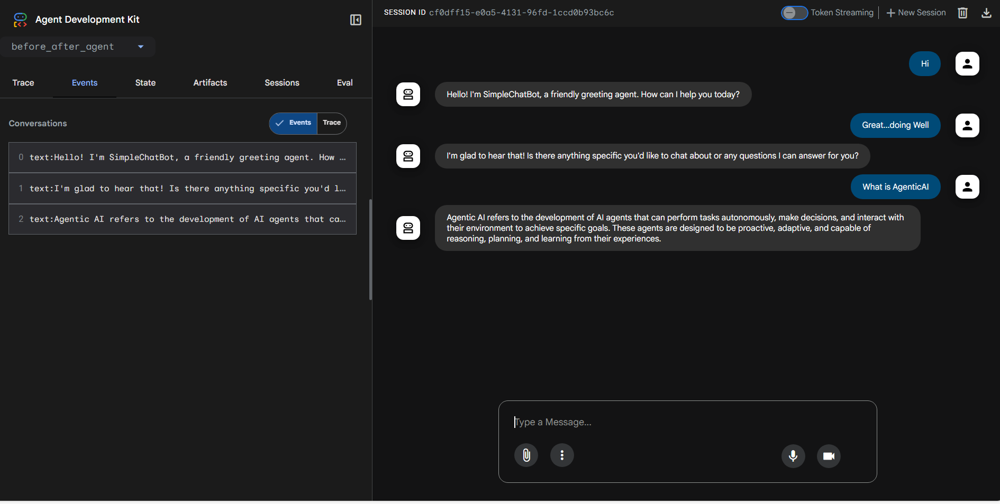

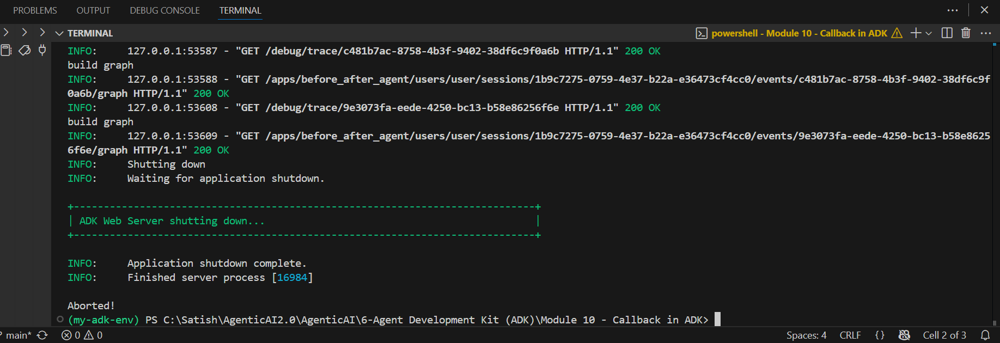  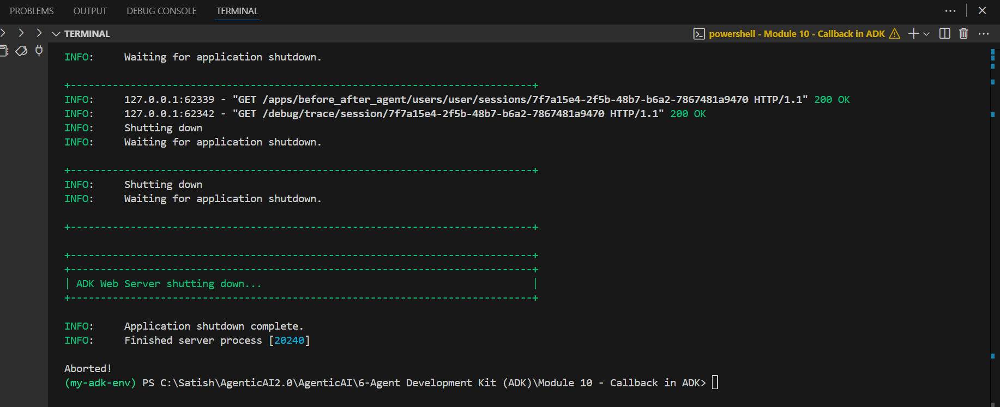

---


## `before_after_tool`
```Python
"""
Before and After Tool Callbacks Example

This example demonstrates using tool callbacks to modify tool behavior.
"""

import copy
from typing import Any, Dict, Optional

from google.adk.agents import LlmAgent
from google.adk.tools.base_tool import BaseTool
from google.adk.tools.tool_context import ToolContext


# --- Define a Simple Tool Function ---
def get_capital_city(country: str) -> Dict[str, str]:
    """
    Retrieves the capital city of a given country.

    Args:
        country: Name of the country

    Returns:
        Dictionary with the capital city result
    """
    print(f"[TOOL] Executing get_capital_city tool with country: {country}")

    country_capitals = {
        "united states": "Washington, D.C.",
        "usa": "Washington, D.C.",
        "canada": "Ottawa",
        "france": "Paris",
        "germany": "Berlin",
        "japan": "Tokyo",
        "brazil": "Brasília",
        "australia": "Canberra",
        "india": "New Delhi",
    }

    # Use lowercase for comparison
    result = country_capitals.get(country.lower(), f"Capital not found for {country}")
    print(f"[TOOL] Result: {result}")
    print(f"[TOOL] Returning: {{'result': '{result}'}}")

    return {"result": result}


# --- Define Before Tool Callback ---
def before_tool_callback(
    tool: BaseTool, args: Dict[str, Any], tool_context: ToolContext
) -> Optional[Dict]:
    """
    Simple callback that modifies tool arguments or skips the tool call.
    """
    tool_name = tool.name
    print(f"[Callback] Before tool call for '{tool_name}'")
    print(f"[Callback] Original args: {args}")

    # If someone asks about 'Merica, convert to United States
    if tool_name == "get_capital_city" and args.get("country", "").lower() == "america":
        print("[Callback] Converting 'America to 'United States'")
        args["country"] = "United States"
        print(f"[Callback] Modified args: {args}")
        return None

    # Skip the call completely for restricted countries
    if (
        tool_name == "get_capital_city"
        and args.get("country", "").lower() == "restricted"
    ):
        print("[Callback] Blocking restricted country")
        return {"result": "Access to this information has been restricted."}

    print("[Callback] Proceeding with normal tool call")
    return None


# --- Define After Tool Callback ---
def after_tool_callback(
    tool: BaseTool, args: Dict[str, Any], tool_context: ToolContext, tool_response: Dict
) -> Optional[Dict]:
    """
    Simple callback that modifies the tool response after execution.
    """
    tool_name = tool.name
    print(f"[Callback] After tool call for '{tool_name}'")
    print(f"[Callback] Args used: {args}")
    print(f"[Callback] Original response: {tool_response}")

    original_result = tool_response.get("result", "")
    print(f"[Callback] Extracted result: '{original_result}'")

    # Add a note for any USA capital responses
    if tool_name == "get_capital_city" and "washington" in original_result.lower():
        print("[Callback] DETECTED USA CAPITAL - adding patriotic note!")

        # Create a modified copy of the response
        modified_response = copy.deepcopy(tool_response)
        modified_response["result"] = (
            f"{original_result} (Note: This is the capital of the USA. 🇺🇸)"
        )
        modified_response["note_added_by_callback"] = True

        print(f"[Callback] Modified response: {modified_response}")
        return modified_response

    print("[Callback] No modifications needed, returning original response")
    return None


# Create the Agent
root_agent = LlmAgent(
    name="tool_callback_agent",
    model="gemini-2.0-flash",
    description="An agent that demonstrates tool callbacks by looking up capital cities",
    instruction="""
    You are a helpful geography assistant.
    
    Your job is to:
    - Find capital cities when asked using the get_capital_city tool
    - Use the exact country name provided by the user
    - ALWAYS return the EXACT result from the tool, without changing it
    - When reporting a capital, display it EXACTLY as returned by the tool
    
    Examples:
    - "What is the capital of France?" → Use get_capital_city with country="France"
    - "Tell me the capital city of Japan" → Use get_capital_city with country="Japan"
    """,
    tools=[get_capital_city],
    before_tool_callback=before_tool_callback,
    after_tool_callback=after_tool_callback,
)
```

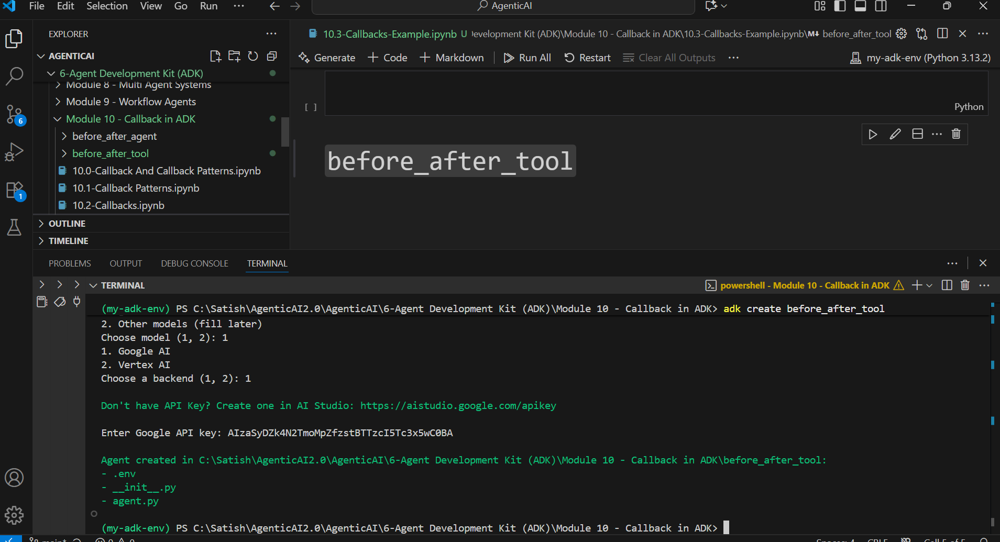 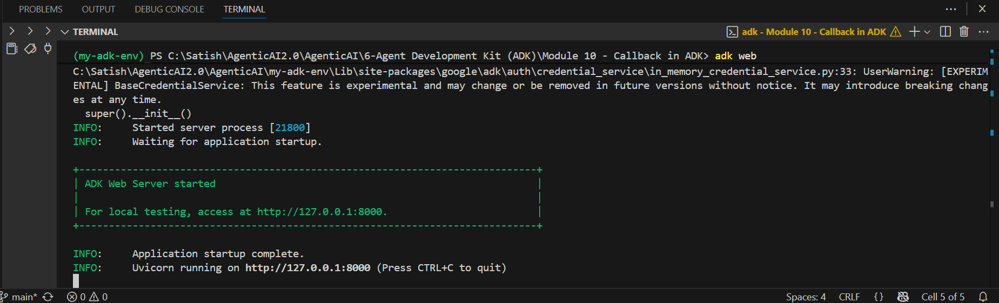 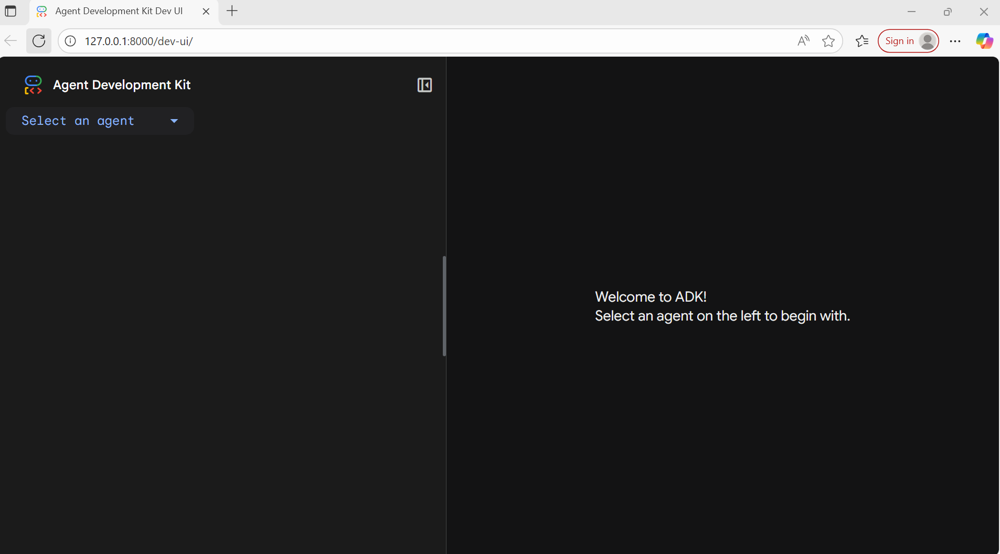 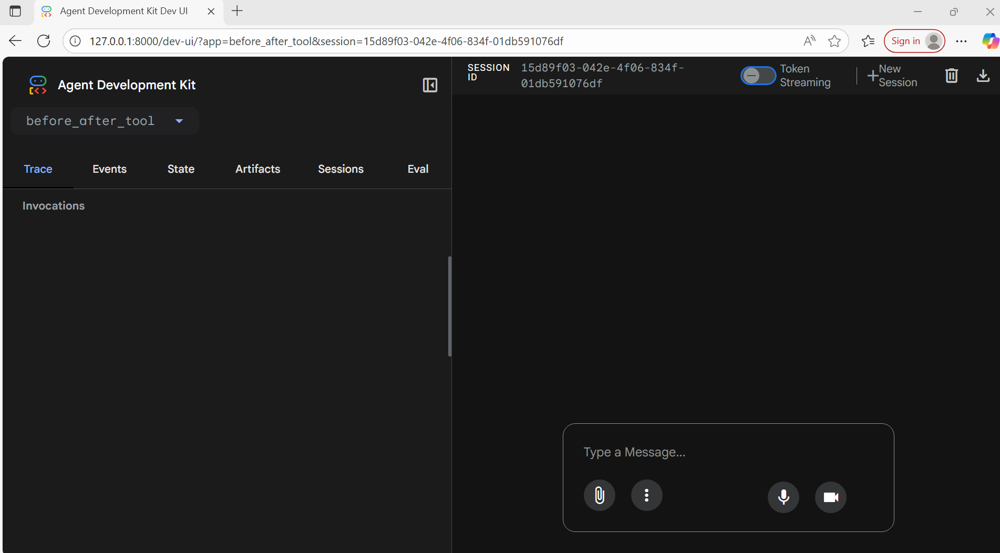 

### `Logs`
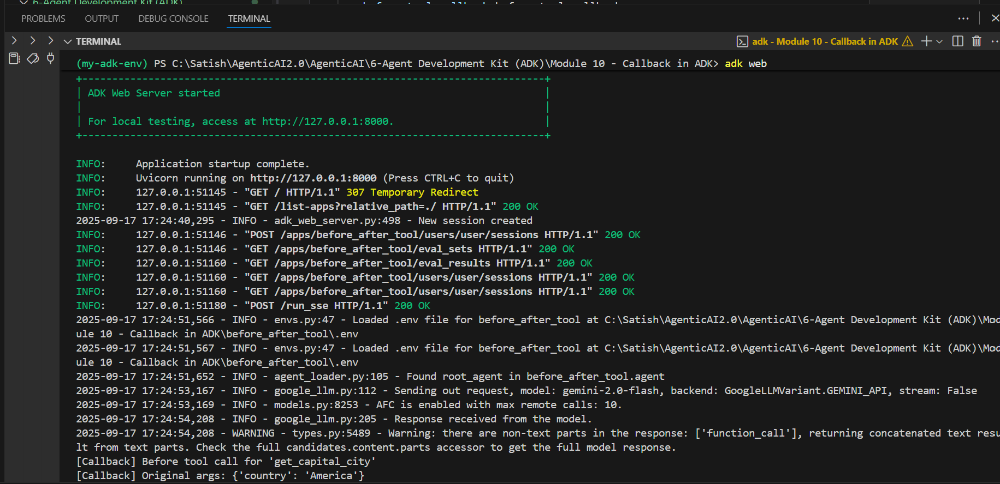 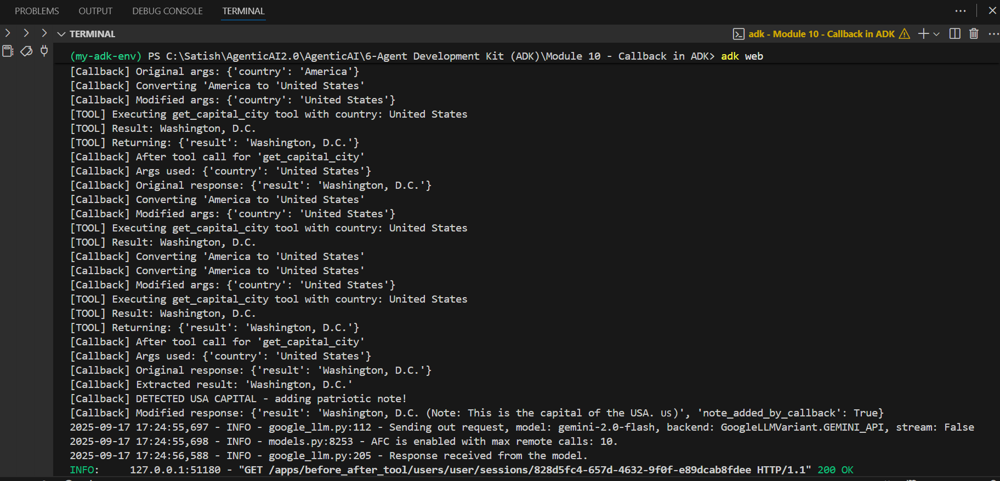 

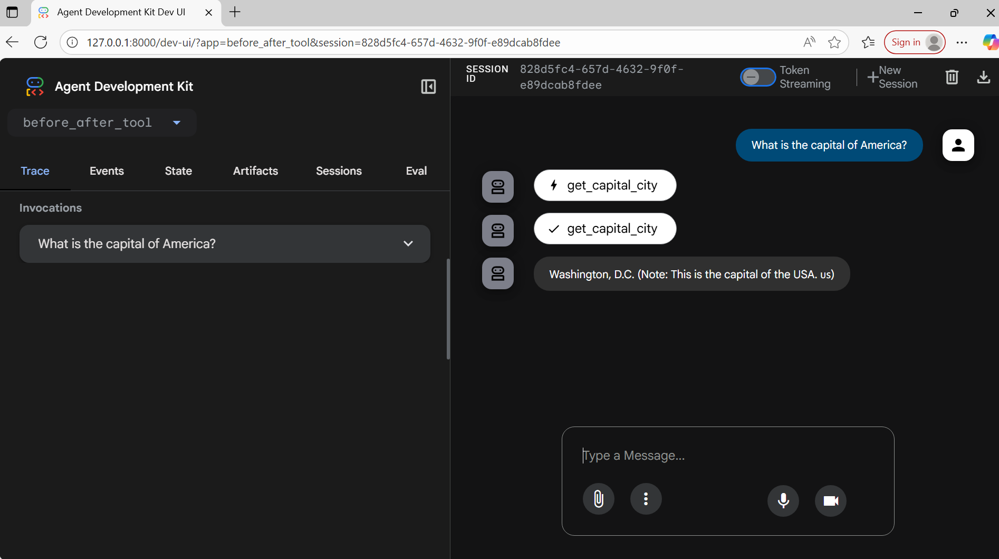 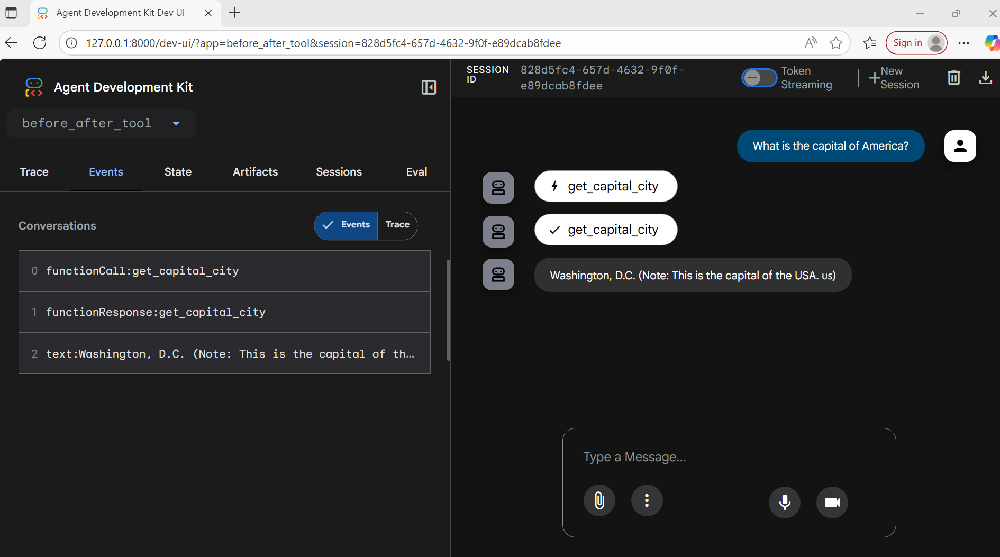 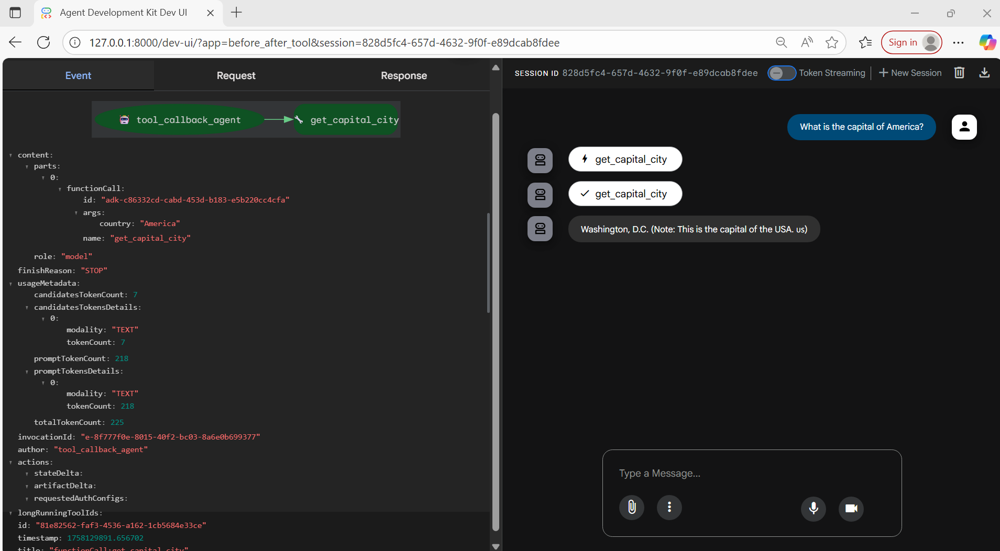 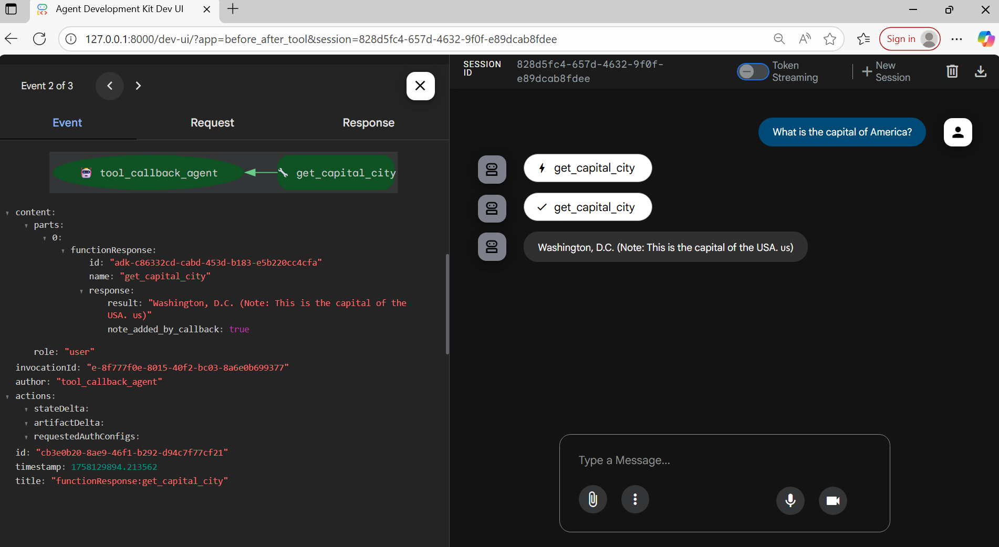 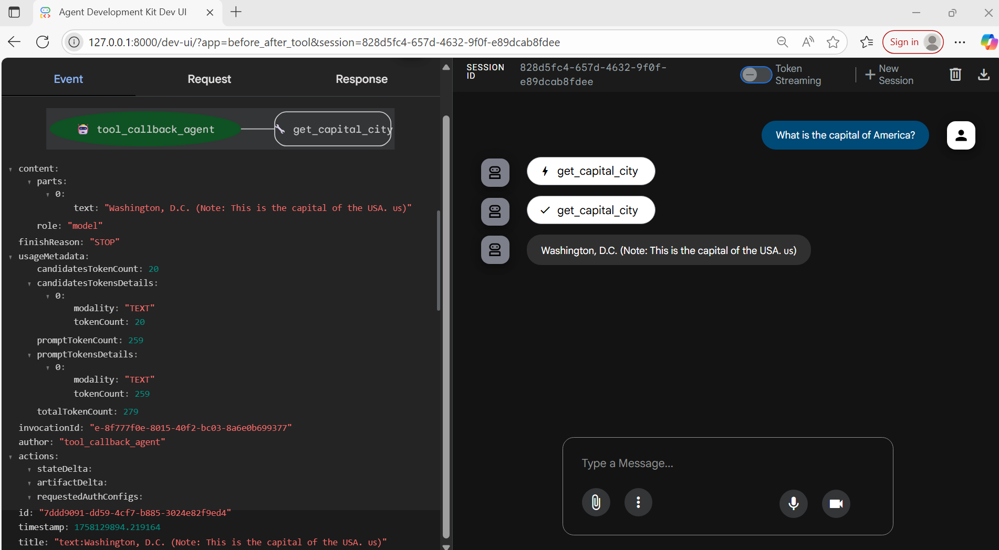 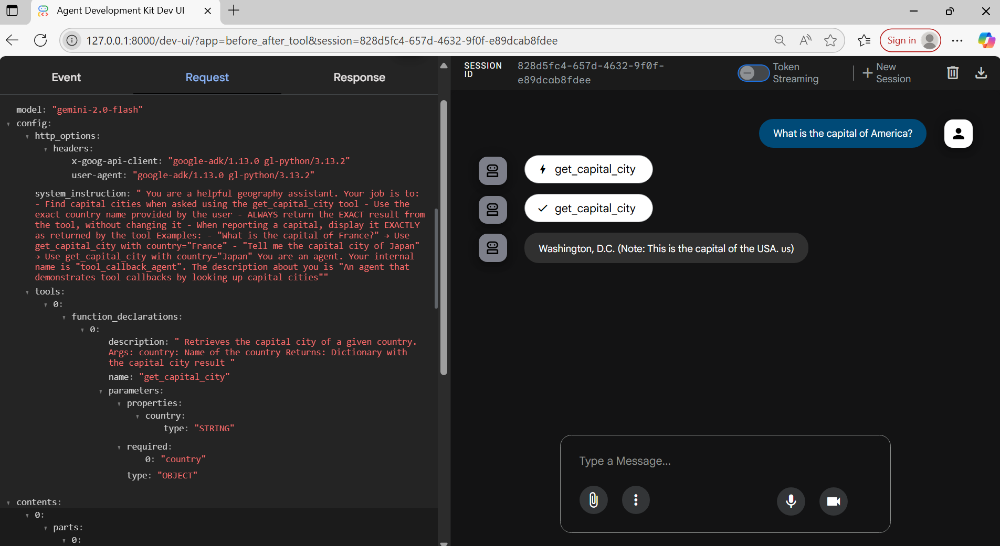 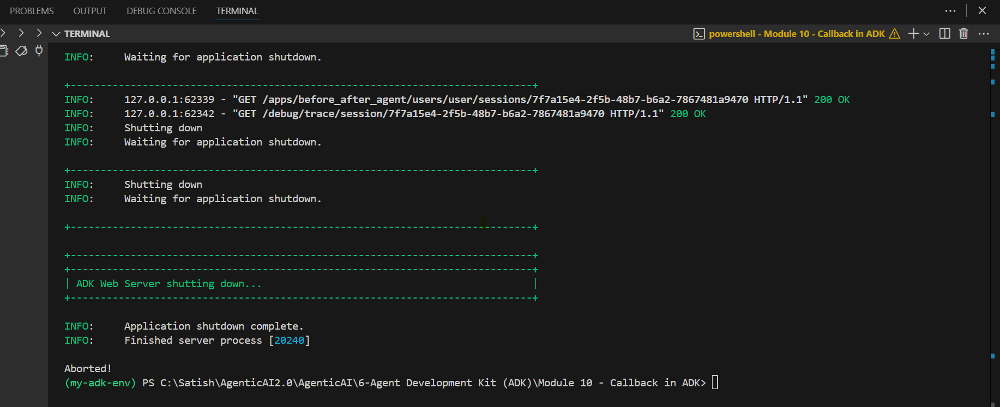

----

## `before_after_tool`
```Python
"""
Before and After Model Callbacks Example

This example demonstrates using model callbacks 
to filter content and log model interactions.
"""

import copy
from datetime import datetime
from typing import Optional

from google.adk.agents import LlmAgent
from google.adk.agents.callback_context import CallbackContext
from google.adk.models import LlmRequest, LlmResponse
from google.genai import types


def before_model_callback(
    callback_context: CallbackContext, llm_request: LlmRequest
) -> Optional[LlmResponse]:
    """
    This callback runs before the model processes a request.
    It filters inappropriate content and logs request info.

    Args:
        callback_context: Contains state and context information
        llm_request: The LLM request being sent

    Returns:
        Optional LlmResponse to override model response
    """
    # Get the state and agent name
    state = callback_context.state
    agent_name = callback_context.agent_name

    # Extract the last user message
    last_user_message = ""
    if llm_request.contents and len(llm_request.contents) > 0:
        for content in reversed(llm_request.contents):
            if content.role == "user" and content.parts and len(content.parts) > 0:
                if hasattr(content.parts[0], "text") and content.parts[0].text:
                    last_user_message = content.parts[0].text
                    break

    # Log the request
    print("=== MODEL REQUEST STARTED ===")
    print(f"Agent: {agent_name}")
    if last_user_message:
        print(f"User message: {last_user_message[:100]}...")
        # Store for later use
        state["last_user_message"] = last_user_message
    else:
        print("User message: <empty>")

    print(f"Timestamp: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")

    # Check for inappropriate content
    if last_user_message and "sucks" in last_user_message.lower():
        print("=== INAPPROPRIATE CONTENT BLOCKED ===")
        print("Blocked text containing prohibited word: 'sucks'")

        print("[BEFORE MODEL] ⚠️ Request blocked due to inappropriate content")

        # Return a response to skip the model call
        return LlmResponse(
            content=types.Content(
                role="model",
                parts=[
                    types.Part(
                        text="I cannot respond to messages containing inappropriate language. "
                        "Please rephrase your request without using words like 'sucks'."
                    )
                ],
            )
        )

    # Record start time for duration calculation
    state["model_start_time"] = datetime.now()
    print("[BEFORE MODEL] ✓ Request approved for processing")

    # Return None to proceed with normal model request
    return None


def after_model_callback(
    callback_context: CallbackContext, llm_response: LlmResponse
) -> Optional[LlmResponse]:
    """
    Simple callback that replaces negative words with more positive alternatives.

    Args:
        callback_context: Contains state and context information
        llm_response: The LLM response received

    Returns:
        Optional LlmResponse to override model response
    """
    # Log completion
    print("[AFTER MODEL] Processing response")

    # Skip processing if response is empty or has no text content
    if not llm_response or not llm_response.content or not llm_response.content.parts:
        return None

    # Extract text from the response
    response_text = ""
    for part in llm_response.content.parts:
        if hasattr(part, "text") and part.text:
            response_text += part.text

    if not response_text:
        return None

    # Simple word replacements
    replacements = {
        "problem": "challenge",
        "difficult": "complex",
    }

    # Perform replacements
    modified_text = response_text
    modified = False

    for original, replacement in replacements.items():
        if original in modified_text.lower():
            modified_text = modified_text.replace(original, replacement)
            modified_text = modified_text.replace(
                original.capitalize(), replacement.capitalize()
            )
            modified = True

    # Return modified response if changes were made
    if modified:
        print("[AFTER MODEL] ↺ Modified response text")

        modified_parts = [copy.deepcopy(part) for part in llm_response.content.parts]
        for i, part in enumerate(modified_parts):
            if hasattr(part, "text") and part.text:
                modified_parts[i].text = modified_text

        return LlmResponse(content=types.Content(role="model", parts=modified_parts))

    # Return None to use the original response
    return None


# Create the Agent
root_agent = LlmAgent(
    name="content_filter_agent",
    model="gemini-2.0-flash",
    description="An agent that demonstrates model callbacks for content filtering and logging",
    instruction="""
    You are a helpful assistant.
    
    Your job is to:
    - Answer user questions concisely
    - Provide factual information
    - Be friendly and respectful
    """,
    before_model_callback=before_model_callback,
    after_model_callback=after_model_callback,
)
```
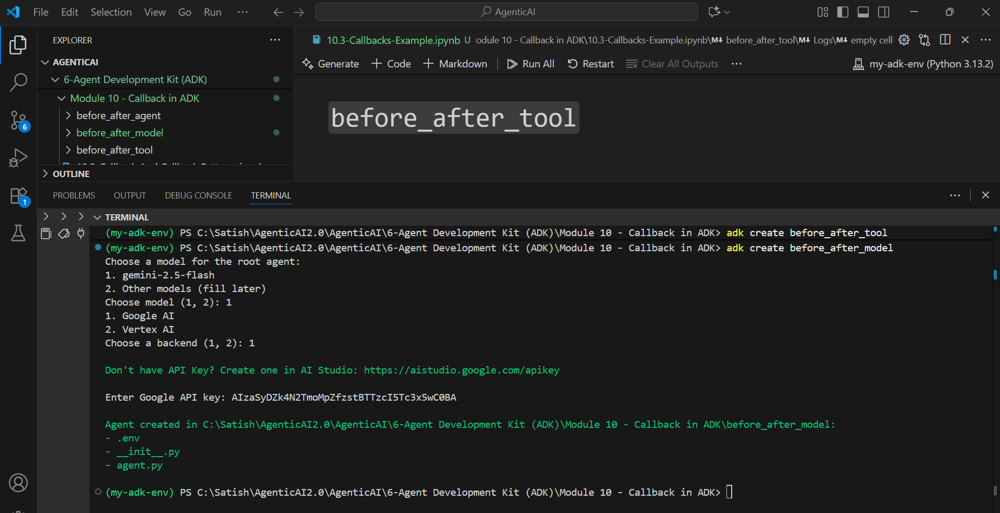 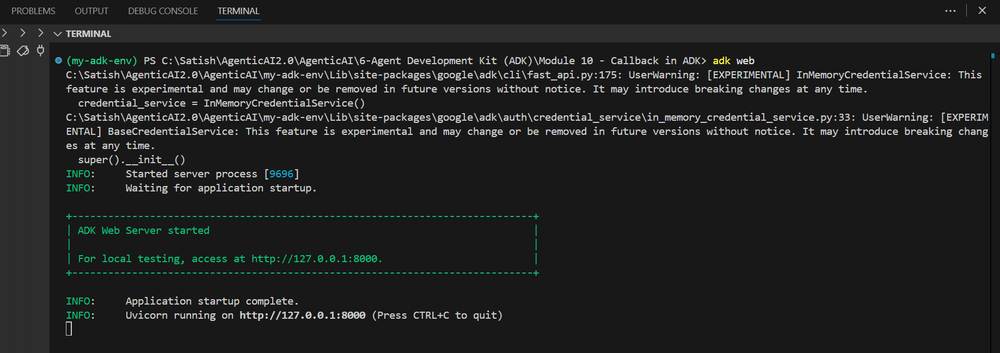 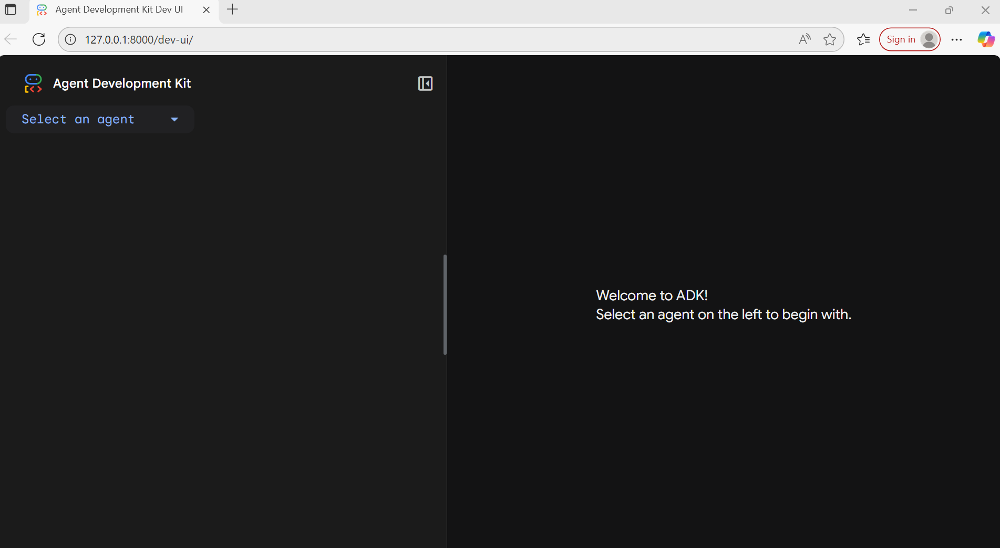 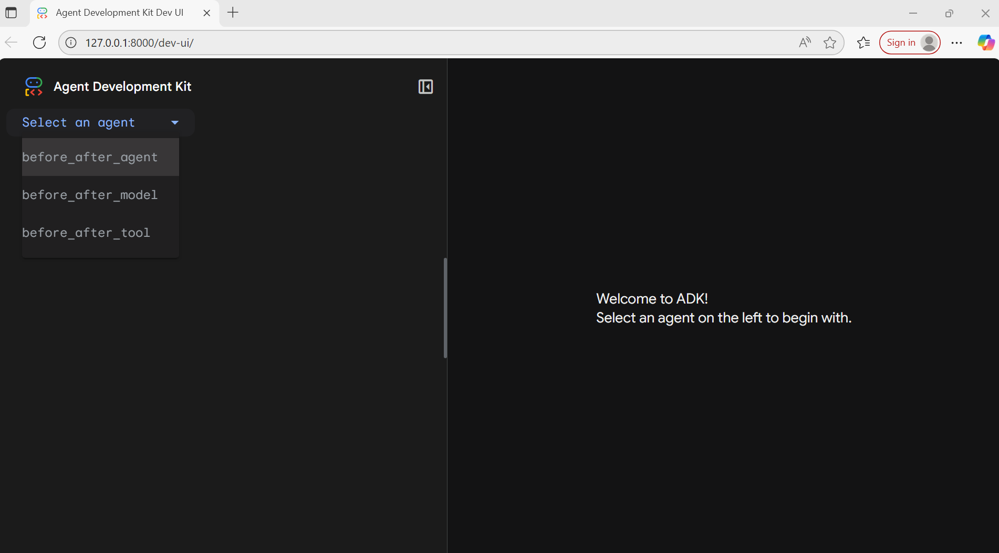 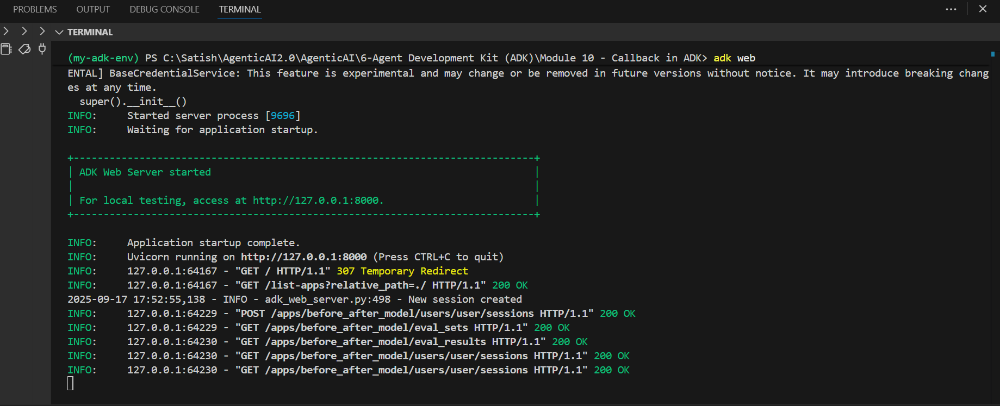 
...
 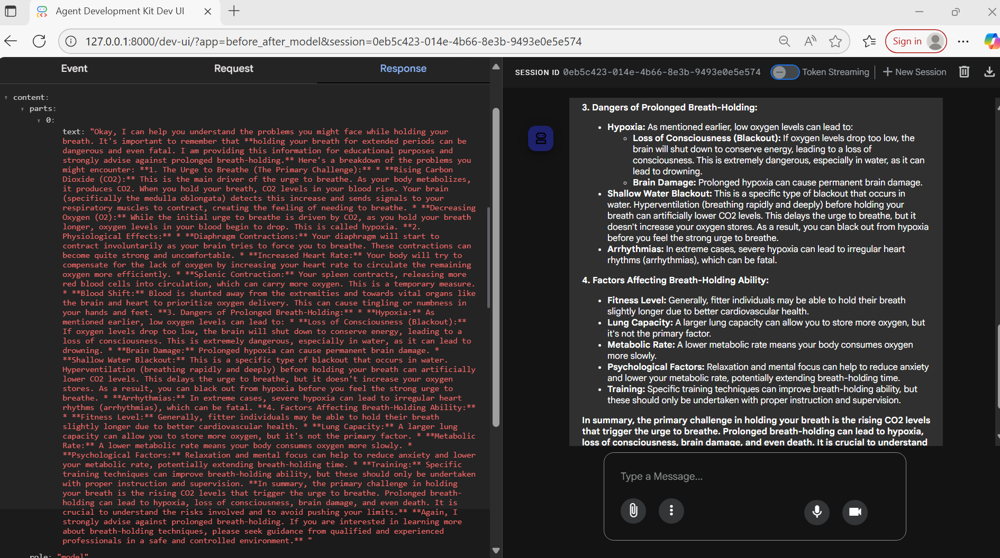 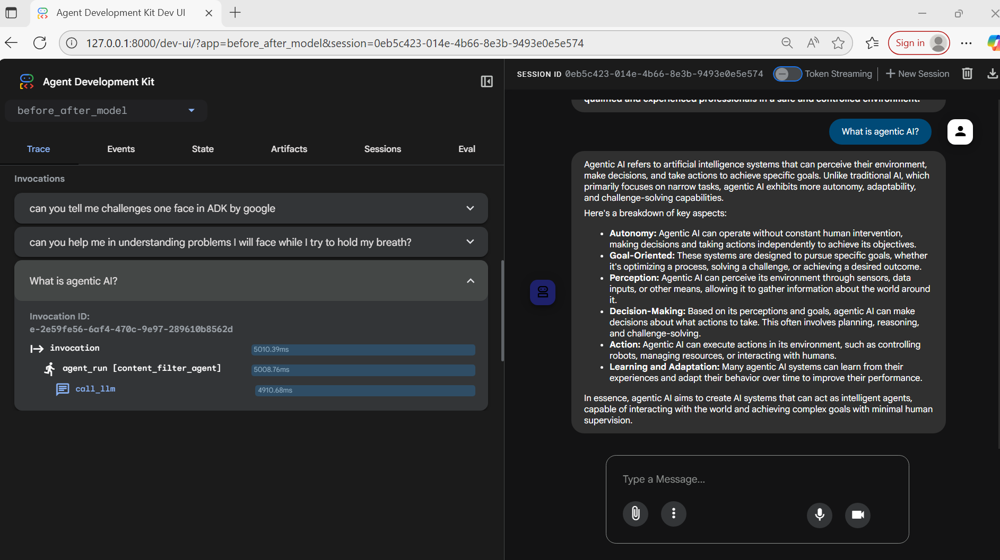 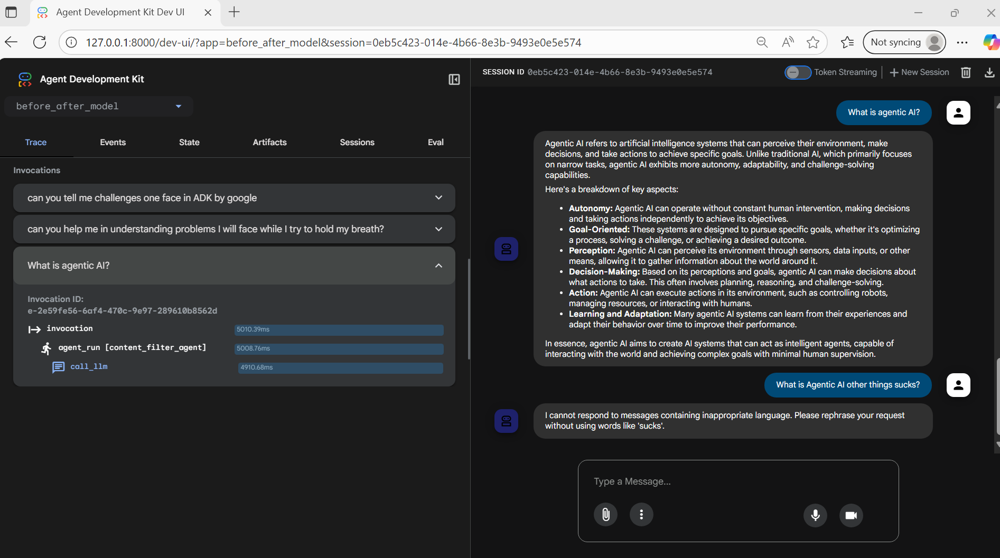 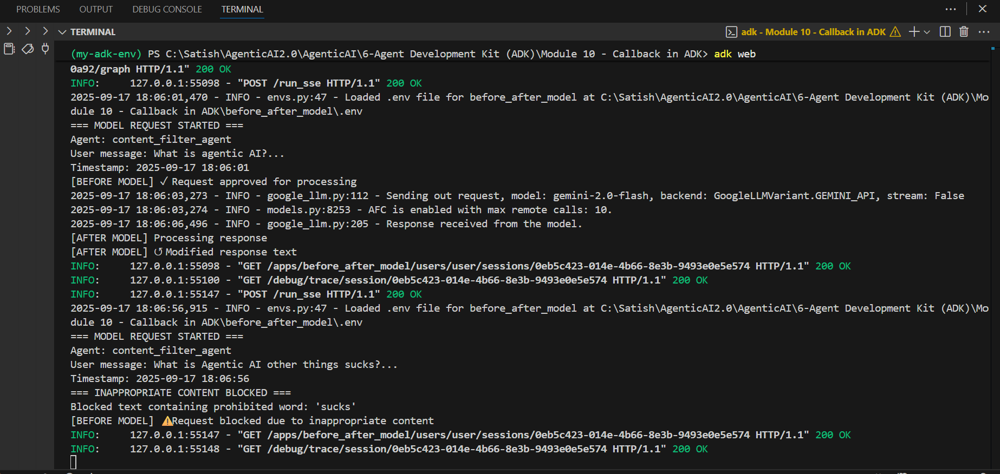 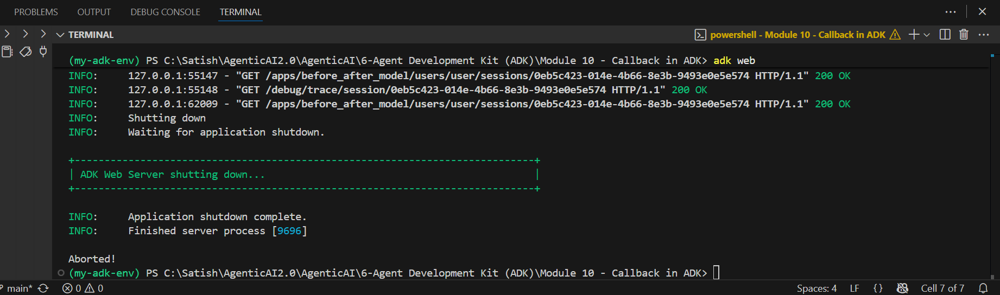

---